In [1]:
#Import
import pandas as pd
import numpy as np
from scipy import stats
import statsmodels.api as sm
from scipy.stats.mstats import winsorize

#Manage time
from datetime import datetime, timedelta

#Plot
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
#Prevent warnings
import warnings
warnings.filterwarnings("ignore")

##### 1. Download factor description

In [3]:
desc_factor = pd.read_excel(r"C:\EDHEC\M2\Cours\Master thesis\Data\Git_Jessen\Factor Details.xlsx")
desc_factor.head(2)

,abr_hxz,name,name_new,abr_jkp,time_to_create,lagged_denom,cite,variations,group,in-sample period,t-stat,p-value,direction,significance,controls
0,Sue,Earnings surprise,Standardized earnings surprise,niq_su,NaN,NaN,Foster Olsen and Shevlin (1984),3.0,Momentum,1974 - 1981,9.11,NaN,1.0,1.0,2.0
1,Abr,Cumulative abnormal stock returns around earni...,Cumulative abnormal stock returns around earni...,NaN,3,NaN,Chan Jegadeesh and Lakonishok (1996) 1972/1,3.0,Momentum,1977 - 1993,4.25,NaN,1.0,NaN,2.0


#### 2. Dowload Market Data

In [4]:
market_ret = pd.read_csv(r"C:\EDHEC\M2\Cours\Master thesis\Data\Git_Jessen\market_returns.csv")
#Only interested in the US
us_market = market_ret[market_ret["excntry"]=="USA"].reset_index().drop(columns=["index"])
us_market["eom"] = pd.to_datetime(us_market["eom"], format="%Y-%m-%d")
us_market.head()

,excntry,eom,stocks,me_lag1,dolvol_lag1,mkt_vw_lcl,mkt_ew_lcl,mkt_vw,mkt_ew,mkt_vw_exc,mkt_ew_exc
0,USA,1926-01-31,489,27331.261187,NaN,0.000542,0.023559,0.000542,0.023559,-0.002409,0.020608
1,USA,1926-02-28,494,27526.823063,2.655562e+09,-0.033053,-0.053738,-0.033053,-0.053738,-0.035821,-0.056506
2,USA,1926-03-31,500,26611.872438,2.206993e+09,-0.063894,-0.096404,-0.063894,-0.096404,-0.066672,-0.099182
3,USA,1926-04-30,505,24849.829375,3.155547e+09,0.036919,0.032482,0.036919,0.032482,0.033847,0.029410
4,USA,1926-05-31,507,25667.635313,1.962540e+09,0.012114,0.000650,0.012114,0.000650,0.011772,0.000308


#### 3. Download US Data

In [5]:
us_lms = pd.read_csv(r"C:\EDHEC\M2\Cours\Master thesis\Data\Git_Jessen\Country Factors\USA.csv")
#Convert eom to datetime
us_lms["eom"] = pd.to_datetime(us_lms["eom"], format="%Y-%m-%d")
#Display
us_lms.head()

,characteristic,direction,excntry,eom,signal,n_stocks,n_stocks_min,ret_ew,ret_vw,ret_vw_cap
0,age,-1,USA,1926-03-31,-1.0,502,8,-0.066167,-0.098837,-0.086738
1,age,-1,USA,1926-04-30,-1.0,505,12,0.010546,-0.006303,-0.000572
2,age,-1,USA,1926-05-31,-2.0,510,17,-0.020292,-0.000190,-0.006332
3,age,-1,USA,1926-06-30,-2.0,512,21,-0.008927,-0.008323,-0.003012
4,age,-1,USA,1926-07-31,-2.0,503,23,0.017724,-0.004220,0.003211


#### 4. Regression - Fama MacBetch regression

The Fama-MacBeth regression is a practical way of testing how factors describe portfolio or asset returns (here the market return). Each portfolio’s return is regressed against one or more factor time series to determine how exposed it is to each one (the “factor exposures”).<br>

In our case, the portfolio would be the market portfolio and the factors the 153 characteristics/anomalies used the paper of JKP.

$$ R_{m,t} = \alpha_{charac_i} + \beta_{charac_i}F_{charac_i,t} + \xi_{charac_i,t} $$ 

- $R_{m,t}$: market return
- $F_{charac_i,t}$: Characteristic return
- $\beta_{charac_i}$: 
- $\alpha_{charac_i}$: risk premia associated with $charac_i$

What matters will be the value of the betas, they represents the sensitivity of the market return to a factor.

In [6]:
#For now only keep equally weighted & start in 1927
factor_df = us_lms[["eom","ret_ew", "characteristic"]]
market_df = us_market[["eom", "mkt_ew"]]

#Get the year 
factor_df["year"] = factor_df["eom"].dt.year
market_df["year"] = market_df["eom"].dt.year

#Only keep year above 1927
#Adjust because market data only goes to 2020
factor_df = factor_df[(factor_df["year"]>1926) & (factor_df["year"]<2021)]
market_df = market_df[market_df["year"]>1926]

#Group by year
factor_yearly = factor_df.groupby(["year", "characteristic"])
market_yearly = market_df.groupby("year")

# Create empty lists to store the results
results=[]

# Loop through each year and characteristics
for name, data in factor_yearly:
    year, charac = name

    # Get the market and portfolio returns for the current year and portfolio
    market_returns = market_yearly.get_group(year)["mkt_ew"].tolist()
    fct_returns = data["ret_ew"].tolist()
    
    #Test - Missing data can lead to missmatch in length raising an error
    try:
        # Fit a linear regression model to the data
        X = sm.add_constant(fct_returns)
        model = sm.OLS(market_returns, X).fit() #sm.OLS(y, X)

        # Extract the alpha and beta coefficients
        alpha = model.params[0]
        beta = model.params[1]
        
        # Append the results to the list
        results.append({'Year': year, 'Characteristic': charac, 'Alpha': alpha, 'Beta': beta})
        
    except:
        pass

# Convert to a dataframe to store the results
results_df = pd.DataFrame(results)

In [7]:
# Print the results dataframe
results_df.head()

,Year,Characteristic,Alpha,Beta
0,1927,age,0.008483,-2.229833
1,1927,ami_126d,0.023465,0.294274
2,1927,beta_dimson_21d,0.031637,-2.222273
3,1927,betadown_252d,0.028361,-1.261059
4,1927,bidaskhl_21d,0.029491,1.085580


#### 5. Plot the betas
1. Create a plot with the betas per characteristics for each year. 
2. Then, average the betas over the in-sample period (i.e before discovery) and out-of-sample (i.e after discovery)

In [8]:
def plot_charac(c):#Select a charateristic
    #Date of anomaly discovery
    disc_year = desc_factor[desc_factor["abr_jkp"]==c]["in-sample period"].values[0].split("-")[1]
    pct_xlim = results_df[(results_df["Characteristic"]==c) & (results_df["Year"]<int(disc_year))].shape[0]/ results_df[(results_df["Characteristic"]==c)].shape[0]
    
    #Avg of betas before and after the discovery
    bef_avg = results_df[(results_df["Characteristic"]==c) & (results_df["Year"]<int(disc_year))]["Beta"].mean()
    after_avg = results_df[(results_df["Characteristic"]==c) & (results_df["Year"]>int(disc_year))]["Beta"].mean()

    # Create a scatter plot of the beta values over time
    fig, ax = plt.subplots(figsize=(12,6))
    ax.axvline(int(disc_year), color = 'r', linestyle ="dashed", label = 'Year of discovery'+str(disc_year))
    ax.axhline(bef_avg, xmax = pct_xlim, color = "g", label="Before D")
    ax.axhline(after_avg, xmin = pct_xlim, color = "orange", label="After D")
    ax.scatter(results_df[results_df["Characteristic"]==c]['Year'], results_df[results_df["Characteristic"]==c]['Beta'])
    
    #Annotate Hline values
    min_year = results_df[results_df["Characteristic"]==c].Year.min()
    ax.annotate(str(round(bef_avg,2)),xy=(min_year,bef_avg + 0.2), color = "g")
    ax.annotate(str(round(after_avg,2)),xy=(int(disc_year) + 1,after_avg + 0.2), color = "orange")

    # Add a title and axis labels
    ax.set_title(c+' - Beta Values Over Time')
    plt.xlabel('Year')
    plt.ylabel('Beta')            
                 
    plt.legend()
    plt.show() 

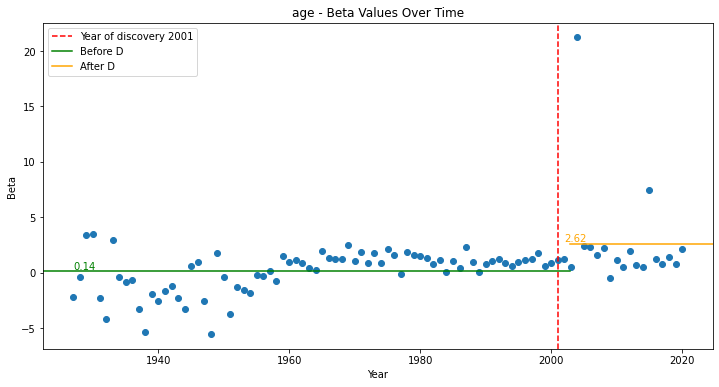

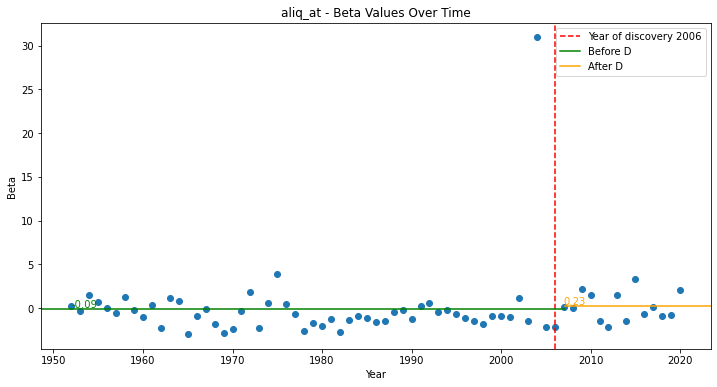

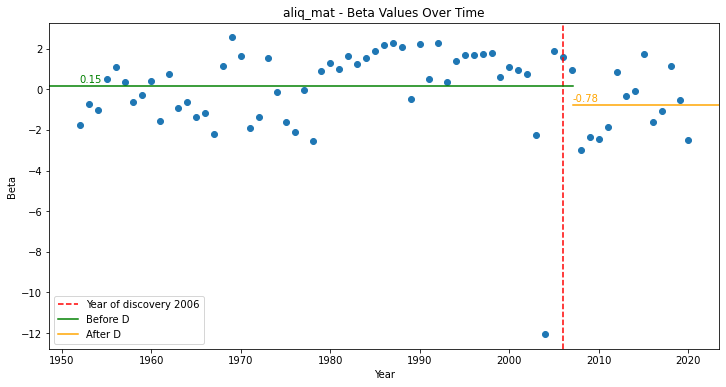

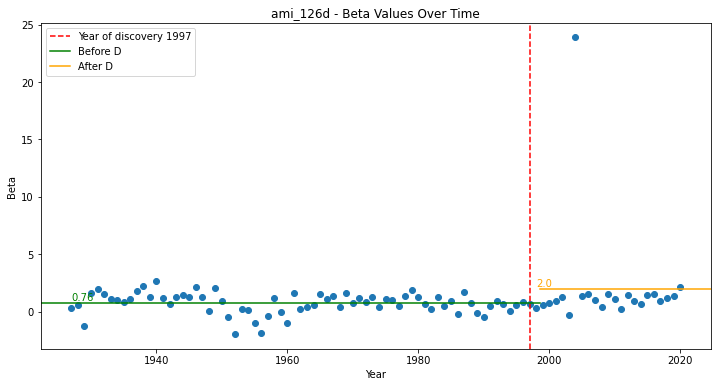

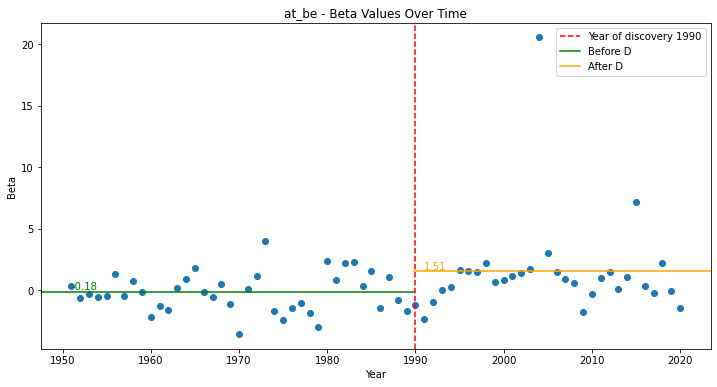

...

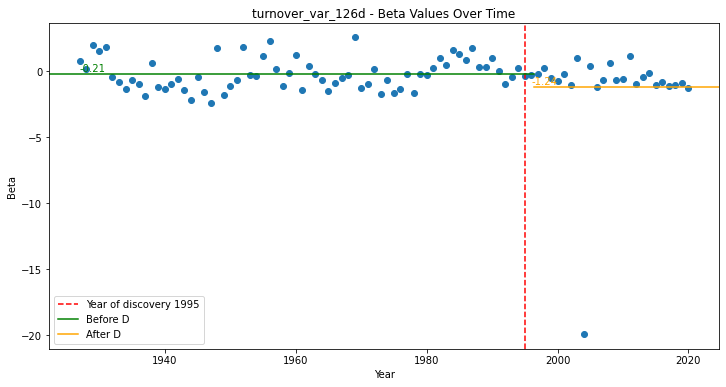

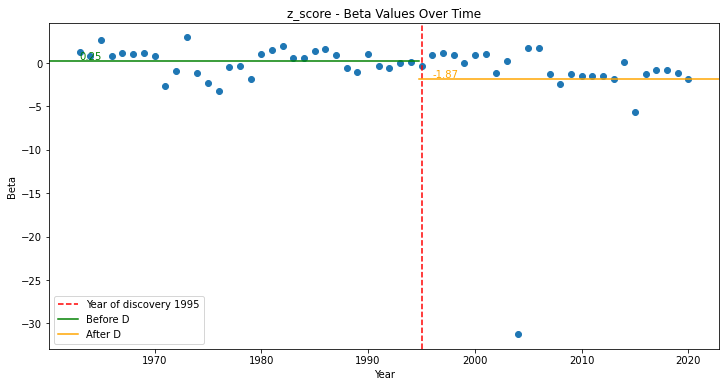

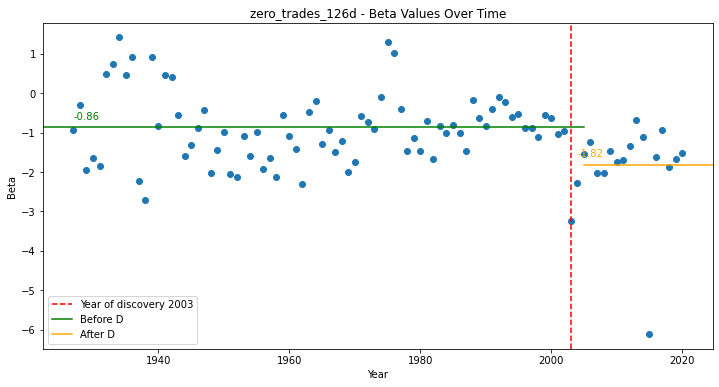

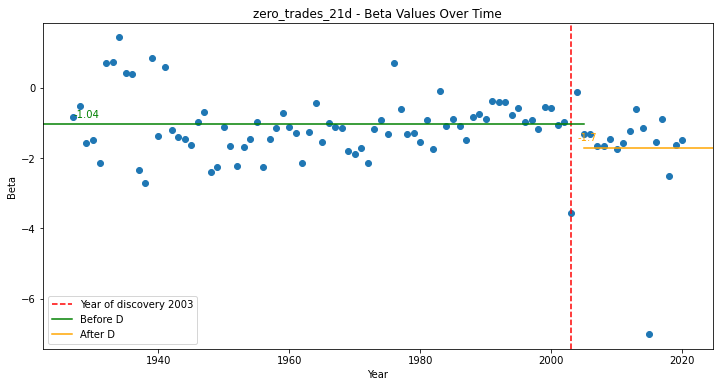

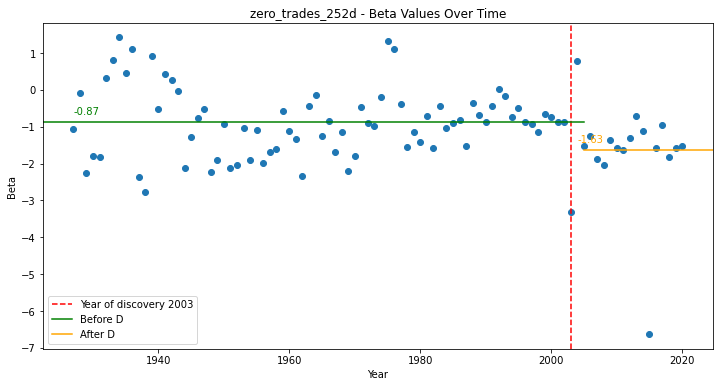

In [9]:
#Plotting all characteristics
for c in us_lms["characteristic"].unique():
    plot_charac(c)

**Observation**<br>
The results are not very relevant. Most of the time beta are higher after discovery which does not make sense. Which should have lower betas because after the anomaly was arbitraged/exploited by market participants market returns are less likely to be driven by those characteristics
- Small number of datapoints out of sample, so heavily impat by any large occurences
- These large occurences seems to all happen around the same date

#### 6. Identification of large occurences

In [10]:
max_year = []
for c in results_df["Characteristic"].unique():
    max_year.append(results_df.iloc[results_df[results_df["Characteristic"]==c]["Beta"].idxmax(), 0])

max_year = pd.DataFrame(pd.DataFrame(max_year).value_counts())
max_year.head(5)

,0
0,
2004,70
1982,9
2015,7
2000,6
1976,5


The value of beta is max in 2004 for almost half of the characteristics studied. However, nothing major happened this year ... How can we interpret that?<br>

What can we do? Well, it seems that the large number of datapoints in-sample tend to smooth the beta in-sample. We will try to use the in-sample period defined by JKP.

#### 7. Adjusting the in-sample period
The oldest date should be at least **1960**.

In [11]:
def plot_charac_adj(results_df, c):#Select a df and charateristic
    
    #In sample period
    in_period = desc_factor[desc_factor["abr_jkp"]==c]["in-sample period"].values[0].split("-")
    start_in = in_period[0]
    disc_year = in_period[1]
    
    #Check the starting date
    if int(start_in) < 1960:
        start_in = 1960
    
    #Avg of betas before and after the discovery
    bef_avg = results_df[(results_df["Characteristic"]==c) 
                         & (results_df["Year"]<int(disc_year))
                         & (results_df["Year"]>int(start_in))]["Beta"].mean()
    
    after_avg = results_df[(results_df["Characteristic"]==c) 
                           & (results_df["Year"]>int(disc_year))]["Beta"].mean()
    
    # Create a scatter plot of the beta values over time
    fig, ax = plt.subplots(figsize=(12,6))
    
    #Define X and Y
    X = results_df[(results_df["Characteristic"]==c) 
                              & (results_df["Year"]>int(start_in))]['Year']
    Y = results_df[(results_df["Characteristic"]==c)
                             & (results_df["Year"]>int(start_in))]['Beta']
    ax.scatter(X, Y)#Scatter plot
    
    #pct for hline limit
    pct_xlim = results_df[(results_df["Characteristic"]==c) 
                          & (results_df["Year"]<int(disc_year))
                          & (results_df["Year"]>int(start_in))].shape[0]/ results_df[(results_df["Characteristic"]==c)
                                                                                    & (results_df["Year"]>int(start_in))].shape[0]
                       
    #Hline of average
    ax.axhline(bef_avg, xmax = pct_xlim, color = "g", label="Before D")
    ax.axhline(after_avg, xmin = pct_xlim, color = "orange", label="After D")
    
    #Annotate Hline values
    min_year = int(start_in)
    ax.annotate(str(round(bef_avg,2)),xy=(min_year,bef_avg + 0.2), color = "g")
    ax.annotate(str(round(after_avg,2)),xy=(int(disc_year) + 1,after_avg + 0.2), color = "orange")
    
    #Vertical line - Discovery year
    ax.axvline(int(disc_year), color = 'r', linestyle ="dashed", label = 'Year of discovery'+str(disc_year))

    # Add a title and axis labels
    ax.set_title(c+' - Beta Values Over Time')
    plt.xlabel('Year')
    plt.ylabel('Beta')            
                 
    plt.legend()
    plt.show() 

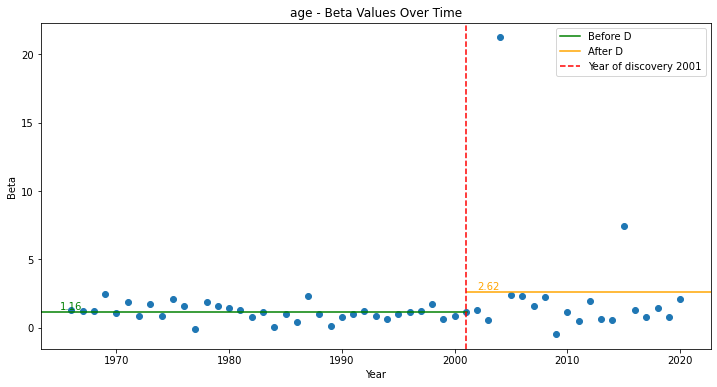

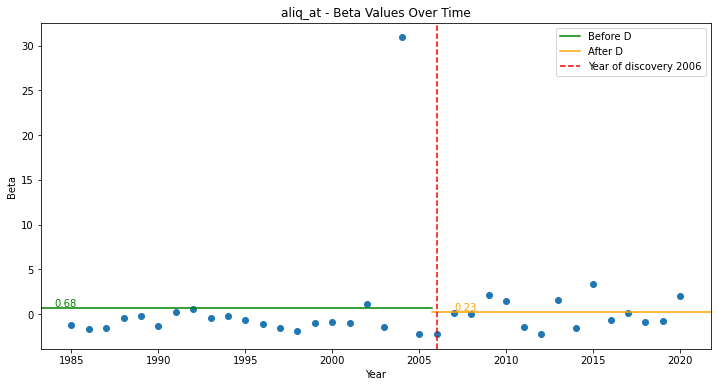

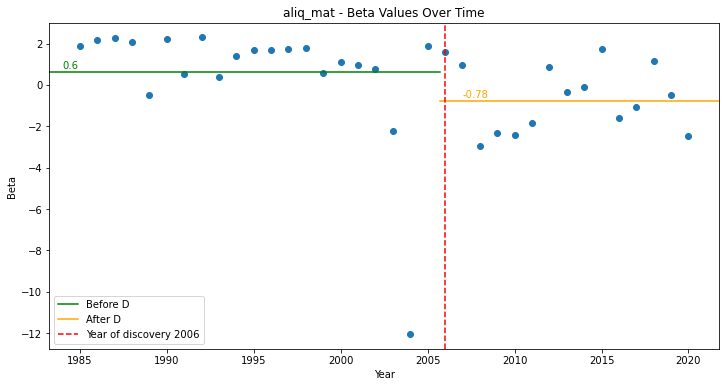

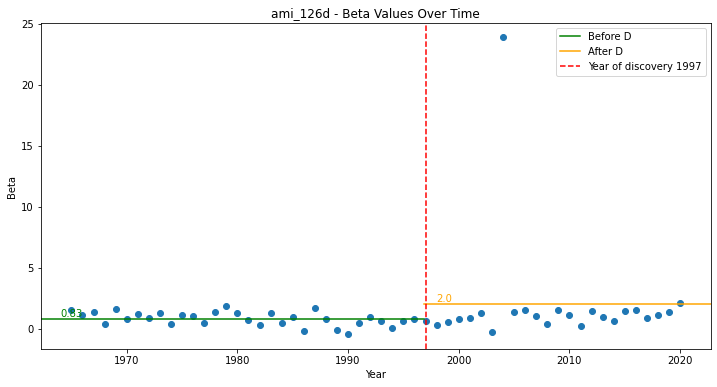

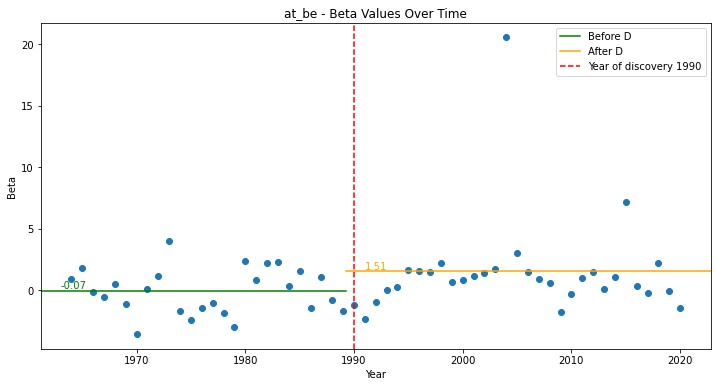

...

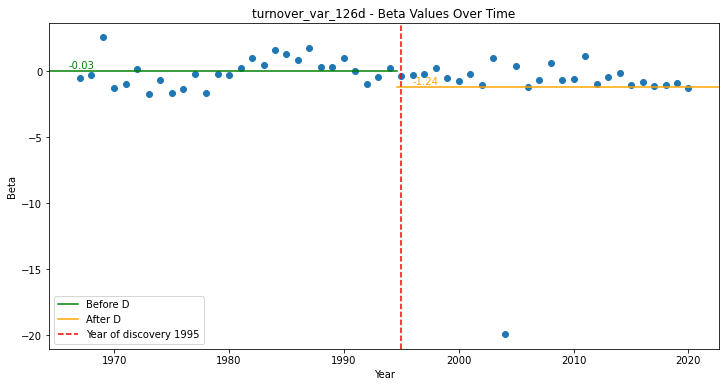

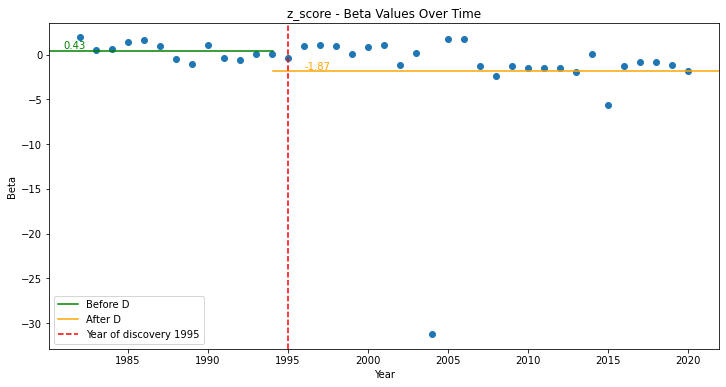

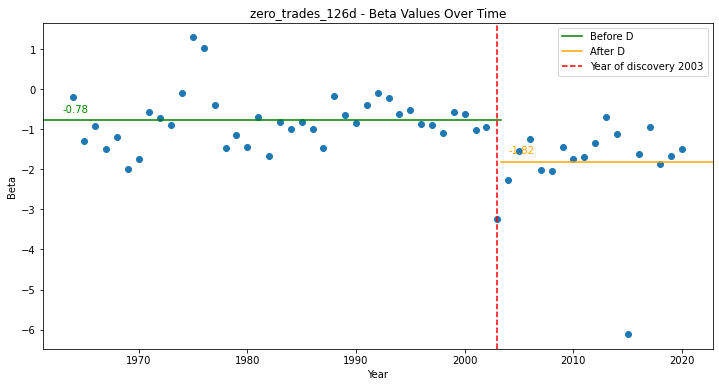

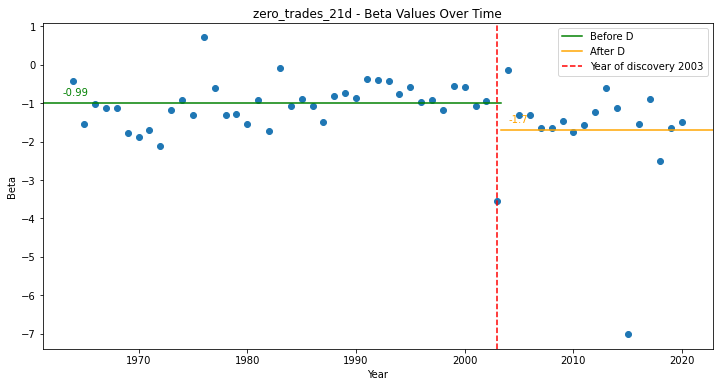

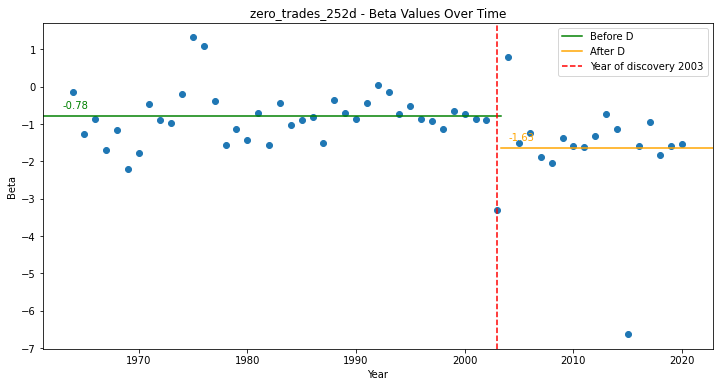

In [12]:
#Plotting all characteristics
for c in us_lms["characteristic"].unique():
    plot_charac_adj(results_df, c)

**Observation**<br>
Better but we need to treat the **extreme values** in the out of sample period ...

- Remove year where the absolute value of the beta is superior to three times the standard deviation

To do so, we are going to work on results_df

#### 8. Winsorization of data
90% winsorization. This will replace the 5% of values below the 5th percentile and the 5% of values above the 95th percentile with the values at the 5th and 95th percentile, respectively. This will be perform on both the in-sample and out-sample period

In [13]:
results_df

,Year,Characteristic,Alpha,Beta
0,1927,age,0.008483,-2.229833
1,1927,ami_126d,0.023465,0.294274
2,1927,beta_dimson_21d,0.031637,-2.222273
3,1927,betadown_252d,0.028361,-1.261059
4,1927,bidaskhl_21d,0.029491,1.085580
...,...,...,...,...
11386,2020,turnover_var_126d,0.000240,-1.307943
11387,2020,z_score,0.010461,-1.859718
11388,2020,zero_trades_126d,-0.005221,-1.506158
11389,2020,zero_trades_21d,-0.003183,-1.481724


In [14]:
#create df to store data
results_adj_df = results_df.copy()
    
for c in results_df["Characteristic"].unique():
    #create copy df 
    temp_df = results_df[(results_df["Characteristic"] == c)].copy()
    #Winsorization 90%
    temp_df["Beta"] = winsorize(temp_df["Beta"], limits=(0.05, 0.05))
    
    #Add results
    results_adj_df[(results_adj_df["Characteristic"] == c)] = temp_df

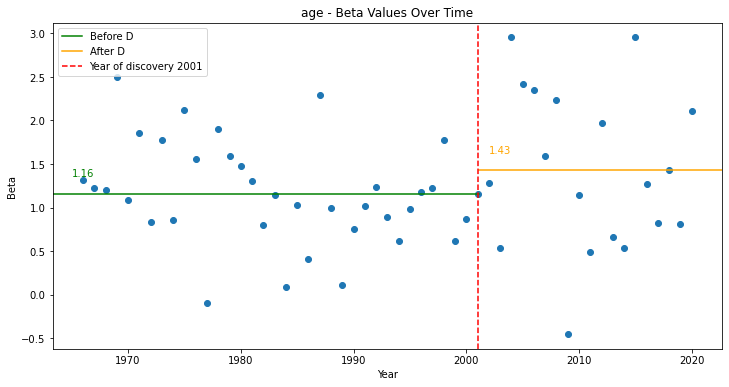

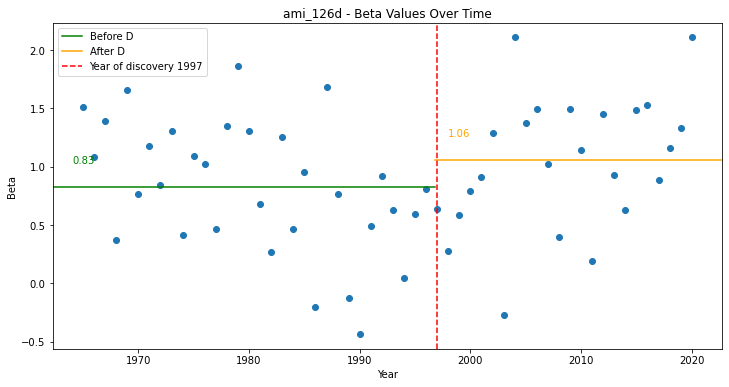

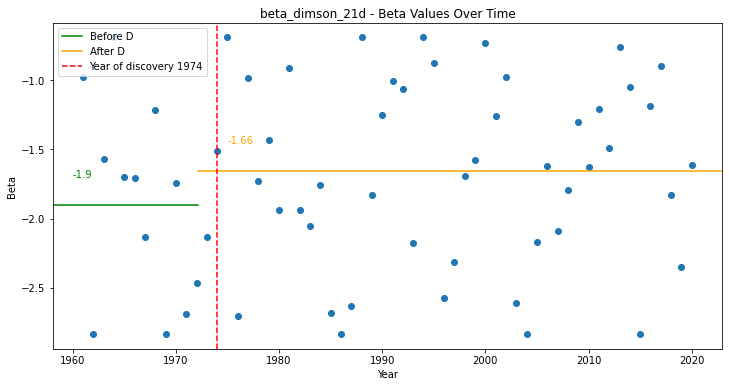

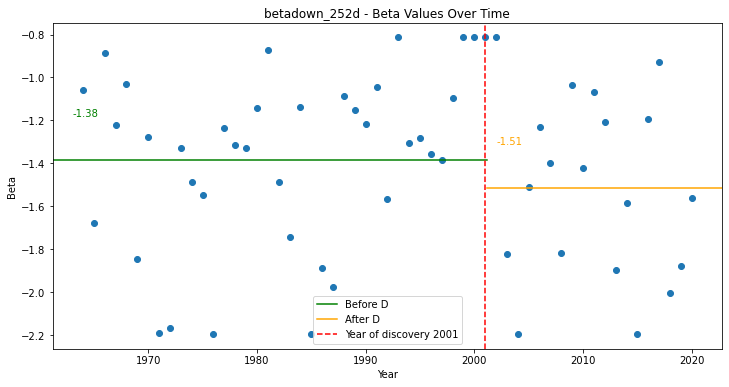

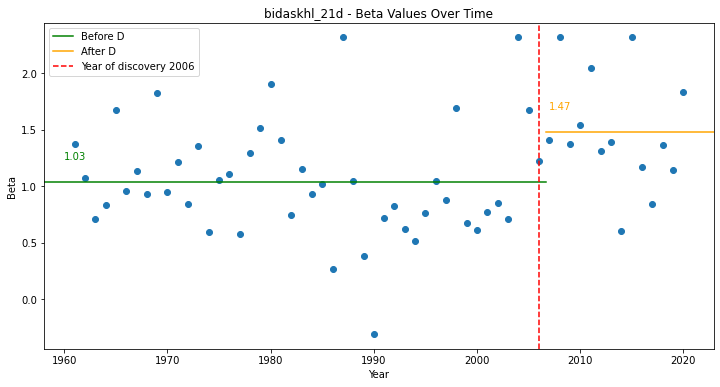

...

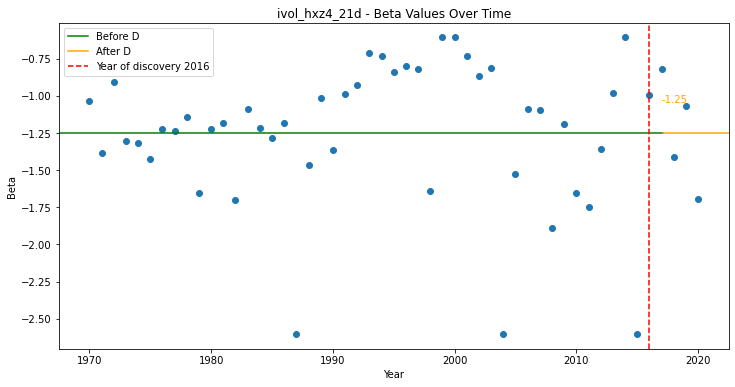

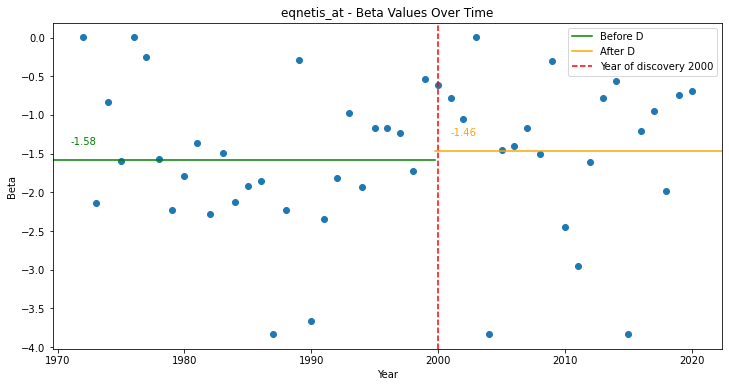

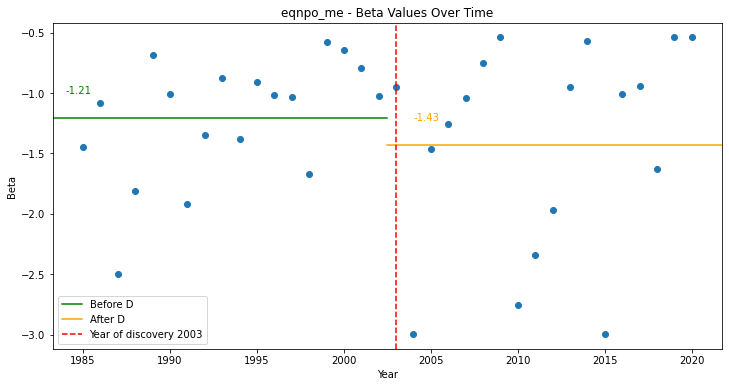

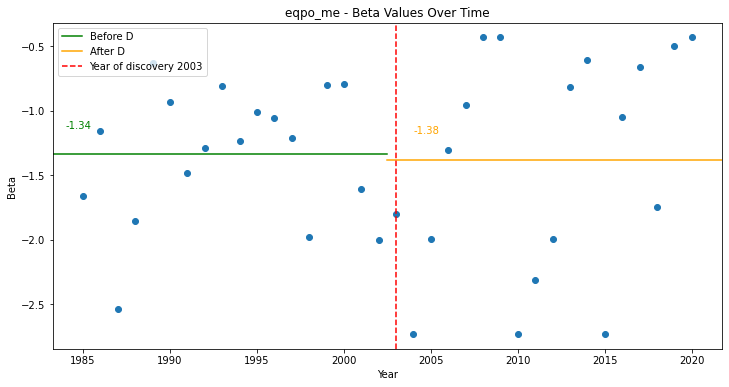

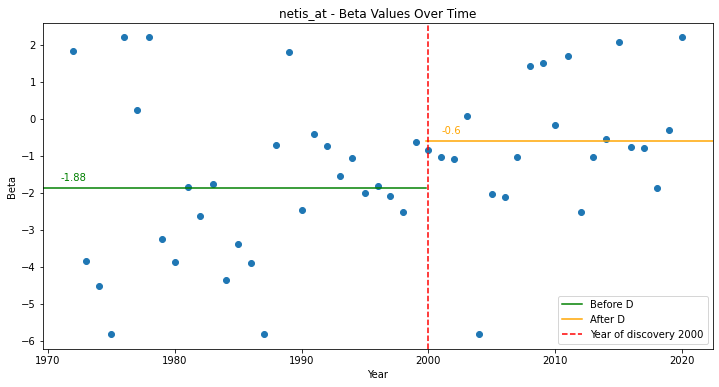

In [15]:
#Plotting all characteristics
for c in results_adj_df["Characteristic"].unique():
    plot_charac_adj(results_adj_df, c)

#### 8. Characteristics with lower beta after discovery
Two possibilities:
1. Betas have the same signs
2. Betas have different signs

In [16]:
list_c = []
for c in results_adj_df["Characteristic"].unique()[:-1]:
    #In sample period
    in_period = desc_factor[desc_factor["abr_jkp"]==c]["in-sample period"].values[0].split("-")
    start_in = in_period[0]
    disc_year = in_period[1]
    
    #Avg of betas before and after the discovery
    bef_avg = results_adj_df[(results_adj_df["Characteristic"]==c) 
                         & (results_adj_df["Year"]<int(disc_year))
                         & (results_adj_df["Year"]>int(start_in))]["Beta"].mean()
    
    after_avg = results_adj_df[(results_adj_df["Characteristic"]==c) 
                           & (results_adj_df["Year"]>int(disc_year))]["Beta"].mean()
    
    if np.sign(bef_avg) == np.sign(after_avg):
        if bef_avg>after_avg:
            list_c.append(c)
    else:
        list_c.append(c)
        
print(len(list_c), list_c)

96 ['betadown_252d', 'chcsho_12m', 'coskew_21d', 'dolvol_126d', 'dolvol_var_126d', 'ivol_capm_252d', 'market_equity', 'mispricing_perf', 'prc_highprc_252d', 'ret_12_1', 'ret_12_7', 'ret_3_1', 'ret_6_1', 'ret_9_1', 'rmax1_21d', 'rmax5_21d', 'rvol_21d', 'seas_1_1an', 'seas_1_1na', 'turnover_126d', 'turnover_var_126d', 'zero_trades_126d', 'zero_trades_21d', 'zero_trades_252d', 'beta_60m', 'betabab_1260d', 'corr_1260d', 'seas_2_5an', 'seas_6_10na', 'seas_11_15na', 'seas_16_20na', 'at_be', 'be_me', 'cash_at', 'debt_me', 'ebit_bev', 'ebit_sale', 'fcf_me', 'gp_at', 'netdebt_me', 'ni_be', 'ocf_at', 'op_at', 'ope_be', 'qmj_prof', 'sale_bev', 'tangibility', 'aliq_at', 'aliq_mat', 'at_turnover', 'cop_at', 'cop_atl1', 'emp_gr1', 'eq_dur', 'fnl_gr1a', 'gp_atl1', 'ival_me', 'ivol_ff3_21d', 'lnoa_gr1a', 'lti_gr1a', 'ncoa_gr1a', 'nfna_gr1a', 'nncoa_gr1a', 'o_score', 'oaccruals_at', 'ocf_at_chg1', 'op_atl1', 'ope_bel1', 'rd_me', 'rd_sale', 'tax_gr1a', 'dgp_dsale', 'dsale_dinv', 'dsale_drec', 'dsale_dsg

#### 9.Interpretation of the betas in relation with the portoflio construction

In [17]:
desc_factor[desc_factor["abr_jkp"] == "eqnpo_12m"]

,abr_hxz,name,name_new,abr_jkp,time_to_create,lagged_denom,cite,variations,group,in-sample period,t-stat,p-value,direction,significance,controls
68,Cei,Composite equity issuance,Equity net payout,eqnpo_12m,NaN,NaN,Daniel and Titman (2006),1.0,INVESTMENT,1968 - 2003,-4.16,NaN,1.0,1.0,2.0
